In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
import os
import geopandas as gpd
import math
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import pandas as pd
import mplleaflet
from shapely import geometry, ops
from sklearn import preprocessing, decomposition
from scipy import sparse, stats, spatial
import scipy.sparse.linalg
from tqdm import tqdm_notebook as tqdm
from pygsp import graphs, filters, plotting

plt.rcParams['figure.figsize'] = (30,15)


# BUDA-PEST 

The assumption that **old parts of a city can be distinguished from the new parts, solely based on the road network** was tested by anaylizing the road newtwork of different cities. 

The dataset used for this specific task was gethered from OpenStreetMap (freely-reusable geospatial data) by extracting the specifc city or region of interest. The data was cleaned, by only keeping drivable or walkable roads, thereby discarding for instance "railways". In addition, a one-to-one correspondance between street name and the specific street was enforced by renaming streets, if geographically distict streets would show the same name. For each road, a multiple of features, such as street length, street curvature etc. were extracted. Those features were then used to construct a graph based on the similarity matrix build from a weighted distance metric. Using the constructed graph, the Fiedler eigenvector was calculated to finally obtain a data clusterization. The initial assumption was verified to a certain extend.

This notebook visualizes the process pipe-line by exploring the street network of Switzerland's capital Bern.

# 1 | Getting The Dataset

The Dataset, which will be the road network of a certain city, is downloaded from https://mapzen.com/data/metro-extracts/
This website can produce extracts from the OpenStreetMap Dataset.

The following cities or areas where extracted using mapzen:
- Bern 
- Budapest 
- New York
- Bologna 
- Denver 
- Lama Mocogno
- Lama Mocogno Area
- Seoul
- London

GeoPandas was used to work with the shapefiles provided by the extracts.
GeoPandas extends the datatypes used by pandas to allow spatial operations on geometric types. 

For more information on GeoPandas: http://geopandas.org/

In [2]:
# Loading the downloaded shapefile

# Bern
shapefile_dir = '../data/bern_switzerland.imposm-shapefiles'
shapefile_name ='bern_switzerland_osm_roads.shp'

shapefile_roads = os.path.join(shapefile_dir, shapefile_name)

# Here we create the GeoPandas Dataset:
df = gpd.GeoDataFrame.from_file(shapefile_roads)
# Renaming all streets tag with "None" to "no_name
df.name[df.name.isnull() == True] = 'no_name'

# In order to have meaningful distances, we use the Mercator projection 
# that preserves the angles and the shapes of small objects
# For more information visit: http://geopandas.org/projections.html
df = df.to_crs({'init': 'epsg:3395'})

## 1.1 | Exploring the Data

**Let's have a look a the data.**

- Column 1: GeoPandas id
- Column 2: osm_id:
- Column 3: type within osm_class
- Column 4: name of the line
- Column 5: if the line is inside a tunnel
- Column 6: if the line is on a bridge
- Column 7: if the line is a one way street
- Column 8: basically the drawing layer, more preciscly the field in osm2pgsql datamodel that map OSM Layers in OSM tags to a number in osm2pgsql model 
- Column 9: tag to denote if only specific vehicles or people have access 
- Column 10: describe the service or services offered by a car shop/garage, or to drill into more detail about a types of "service" roads, railways or waterways
- Column 11: class 



We can see that GeoPanda nicely structures the data provided by OpenStreetMap.
In the last column, the geometry -a line together with its coordinates- can be seen.
We can now work with GeoDataFrame just like a pandas dataframe.

In [3]:
df[0:3]

,id,osm_id,type,name,tunnel,bridge,oneway,ref,z_order,access,service,class,geometry
0,1,2955839.0,rail,no_name,0,0,0,None,7,None,None,railway,LINESTRING (834180.7799455991 5913106.66249309...
1,2,3230982.0,residential,Hochfeldstrasse,0,0,0,None,3,None,None,highway,LINESTRING (826867.6168769542 5903563.51628549...
2,3,3728938.0,primary,Bernstrasse,1,0,0,1;12,-14,None,None,highway,LINESTRING (834386.4750492289 5913916.23293858...


...and this is how the data looks like: 

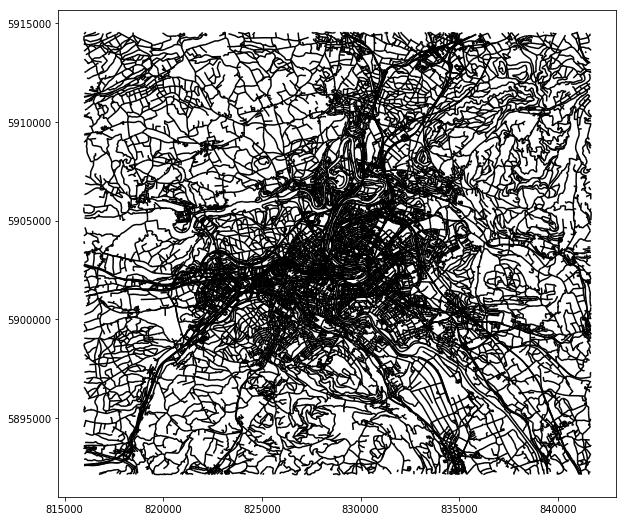

In [4]:
ax = df.plot(color='black',figsize=(10, 10))

To see it printed on a real map, this code could be used: *mplleaflet.show(fig=ax.figure, crs=df.crs)*

Here is an extract as an image: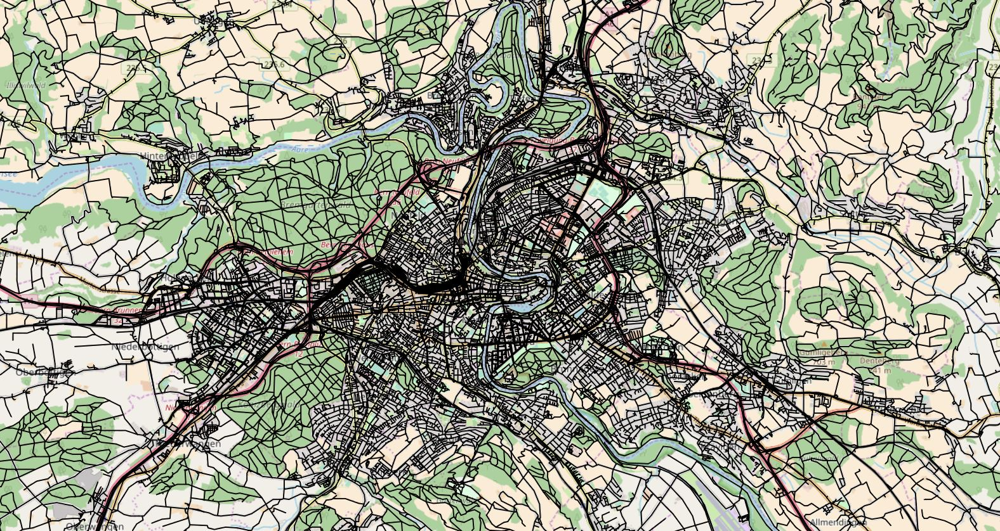

# 2 |  Cleaning The Dataset
## 2.1| Discard All Non-Roads 
The following cell takes the geopandas dataframe and only keeps specific types of entries.

First, the classes are restricted to being only of class "highway" (which in OSM stands for roads). 

Then within this class, it was choosen to 
- keep residential streets
- living streets
- pedestrian streets (often found in the city center)
- trunk ( high performance or high importance roads that don't meet the requirement for motorway)
- primary, secondary and tertiary roads

In [5]:
total_rows_before_cleaning = len(df.index)

In [6]:
# Get Only Highway classes
df=df[df['class']=='highway']

sel = (df['type']=='residential')| (df['type']=='living_street') | (df['type']=='pedestrian')| (df['type']=='trunk') | (df['type']=='primary') | (df['type']=='secondary') | (df['type']=='tertiary') 
df = df[sel]
#check if the types are there
df[sel]["type"].unique()

C:\Users\sonia\Anaconda3\lib\site-packages\geopandas\geodataframe.py:398: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super(GeoDataFrame, self).__getitem__(key)


array(['residential', 'primary', 'secondary', 'tertiary', 'living_street',
       'pedestrian', 'trunk'], dtype=object)

In [7]:
total_rows_after_cleaning = len(df.index)

In [8]:
1-total_rows_after_cleaning/total_rows_before_cleaning

0.8019922879177378

By focusing our interest on streets only we reduced the dataset by slightly more than 80%.

## 2.2| Split And Rename Streets 
*Which Are Geometrically Seperated But Have The Same Name*

Inspiered by: https://stackoverflow.com/questions/47988849/split-lines-based-on-names (a different naming procedure was implemented )

For all streets, which have the same name, their streets are clustered using DBSCAN clustering techniques. 

Then each cluster is identified and the associated streets are renamed in the following way: oldName_clusterNumber 




In [9]:
def split_rename(temp):
    '''Splits streets which are geometrically apart but have the same name
    INPUT: GeoPandas Dataframe of the streets which all have the same name
    OUTPUT: A renamed GeoPandas Dataframe based on the geographic locality of the street.
    Naming convention: oldName_clusterNumber'''
    ids = []
    coords = []

    for row in temp.itertuples():

        geom = np.asarray(row.geometry)
        # Record the geometric loaction of every point
        coords.extend(geom)
        # Record the id of every point
        ids.extend([row.id] * geom.shape[0])

    # Initilaize DBSCAN 
    clust = DBSCAN(eps=0.08)

    # Normalize the coordinates and fit the clusters
    clusters = clust.fit_predict(StandardScaler().fit_transform(coords))

    # store in a pandas dataframe 
    points_clusters = pd.DataFrame({"id":ids, "cluster":clusters})
    #print(points_clusters)
    # One Street Chunk Id should only be assigned to one cluster
    # -> Assign to the cluster where the most points are
    id_cluster = points_clusters.groupby('id').cluster.apply(lambda x : x.mode()).reset_index().drop('level_1',1)

    # Rename 
    temp_add_cluster = temp.merge(id_cluster, on='id')
    temp_add_cluster['name'] = temp_add_cluster.name + '_' + temp_add_cluster.cluster.astype(str)
    temp_add_cluster = temp_add_cluster.drop('cluster', 1)

    return temp_add_cluster

In [10]:
df_split = df.groupby('name').apply(split_rename)

### 2.2.1 Visualization: "Bahnhofstrasse"
Here the previous code is demonstrated:

Bahnhofstrasse is a very common name for the street which leads to (or used to lead) to the railway station. As there are multiple railway stations around Bern, this street name appears naturally often. However, a one-to-one corespondance between street name and street should be achieved. 


1. Without spliting and renaming
2. With spliting and renaming

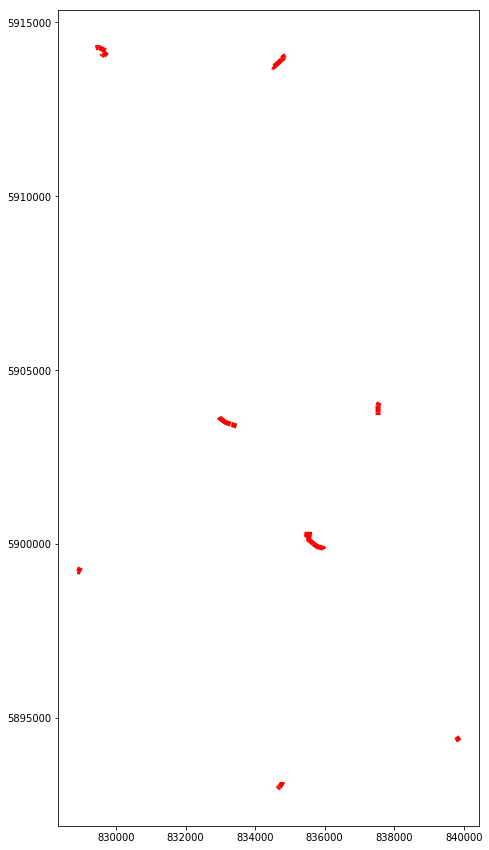

In [11]:
# 1 
grouped = df.groupby('name')
streets = {}
frequency = {}
for key, values in grouped:
    streets[key] = values
    
    
no_split = streets['Bahnhofstrasse'].plot(color='red',linewidth=5.0)

C:\Users\sonia\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: 'name' is both a column name and an index level.
Defaulting to column but this will raise an ambiguity error in a future version
  


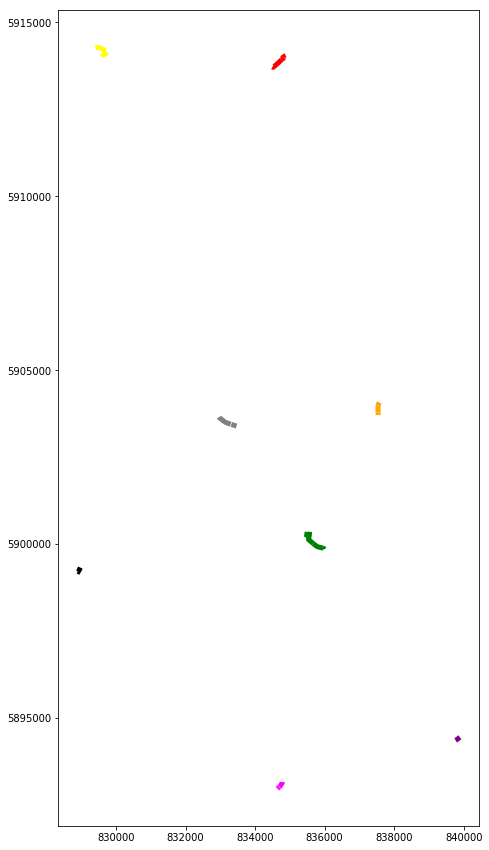

In [12]:
# 2
grouped = df_split.groupby('name')
streets = {}
for key, values in grouped:
    streets[key] = values
    
fig=plt.figure()
ax = streets['Bahnhofstrasse_0'].plot(color='red',linewidth=5.0)
ax = streets['Bahnhofstrasse_1'].plot(ax=ax, color='green',linewidth=5.0);
ax = streets['Bahnhofstrasse_2'].plot(ax=ax, color='orange',linewidth=5.0);
ax = streets['Bahnhofstrasse_3'].plot(ax=ax, color='black',linewidth=5.0);
ax = streets['Bahnhofstrasse_4'].plot(ax=ax, color='yellow',linewidth=5.0);
ax = streets['Bahnhofstrasse_5'].plot(ax=ax, color='purple',linewidth=5.0);
ax = streets['Bahnhofstrasse_6'].plot(ax=ax, color='magenta',linewidth=5.0);
ax = streets['Bahnhofstrasse_7'].plot(ax=ax, color='grey',linewidth=5.0);

### 2.3| Export Cleaned Dataset

To avoid having to collect the data everytime the kernel is restarted, the dataset is saved as a CSV file.

In [14]:
df_split.to_file("../data/cleaned_dataset_bern.shp")

# 3| Feature Creation

To deal with the heterogeneity in dimention and hugeness of the data points, we need to represent them using a set of features appositely chosen to be maximally relevant to the task. 

In [15]:
df = gpd.GeoDataFrame.from_file("../data/cleaned_dataset_bern.shp")

## 3.1| Merging the Streeet Pieces into Streets With the Same Name
To store all the features, we firstly initialize a "classical" Pandas Dataframe with the Street Names

In [16]:
street_names= {"name":df.name.unique()}
dfp_features = pd.DataFrame(street_names)
dfp_features.index.name='Progressive_index'

In [17]:
dfp_features[0:5]

,name
Progressive_index,
0,ARA-Strasse_-1
1,Aarbergergasse_-1
2,AarbÃ¼hlstrasse_-1
3,Aarehalde_-1
4,Aarestrasse_-1


## 3.2| Length Of The Street
We can obtain the length of each street by summing up the length of the street chunks with the same name

In [18]:
street_length = []
for street_name in tqdm(dfp_features['name']):
    sub_gpdf = df[df.name == street_name]
    street_length_curr = []
    for index, row in sub_gpdf.iterrows():
        street_length_curr.append(row['geometry'].length)
    street_length.append(np.sum(street_length_curr))
dfp_features['length'] = street_length

A Jupyter Widget

Let's have a look at the data ordered by length

In [19]:
dfp_features_temp = dfp_features.sort_values('length',ascending=False)
dfp_features_temp[0:7]

,name,length
Progressive_index,,
176,Bernstrasse_4,11793.307927
679,Freiburgstrasse_0,10984.081925
1299,Lindentalstrasse_-1,8140.113976
2253,Thunstrasse_0,7975.498903
252,Bolligenstrasse_0,7153.922945
181,Bernstrasse_9,6668.876028
2586,no_name_11,6506.178714


There are some streets that are unnamed. But since they have been splitted in connected pieces by the splitting algorithm, we can treat them as normal streets (the name is the only information that is missing).

## 3.3| Curvature
Let's determine the curvature of each of the streets.

By the law of cosine, in a triangle of sides $d_1$, $d_2$ and $d_3$, the angle $\alpha$ opposit to the side $d_3$ is given by:

$$acos(\alpha) = \frac{d_1^2 + d_2^2 - d_3^2}{2d_1d_2}.$$
Note that for a straight line the corresponging curvature will be $\pi$ (the output of that formula is included in the interval $[0,\pi]$, the more curvy the line is, the more it tends towards zero.

Since we'll compute an angle for every triplet of coordinates of each street, we need to aggregate these coefficients to have a fixed representation for each street with the same name.
This task can be accomplished by exploiting 7 summary statistics: minimum, maximum, median and the first 4 moments (mean, standard deviation, skew and kurtosis).
Note that the computation of the curvature angle is performed by firstly computing an angle for each of the triplets of coordinates of each chunk of streets with the same name and then merging all the angles of the street in a list (curvature_curr).


In [20]:
std_curvature=[]
mean_curvature = []
max_curvature = []
min_curvature = []
skew_curvature = []
kurtosis_curvature = []
median_curvature = []

for street_name in tqdm(dfp_features['name']):
    sub_gpdf=df[df.name==street_name]
    curvature_curr=[]
    for index, row in sub_gpdf.iterrows():
        line_x= row['geometry'].xy[0]
        line_y= row['geometry'].xy[1]
        temp_ang=[]
        if (len(line_x)<=2):
            temp_ang.append(np.pi)
        else:
            for i in range(len(line_x)-2):
                d1=np.sqrt((line_x[i]-line_x[i+1])**2+(line_y[i]-line_y[i+1])**2)
                d2=np.sqrt((line_x[i+1]-line_x[i+2])**2+(line_y[i+1]-line_y[i+2])**2)
                d3=np.sqrt((line_x[i]-line_x[i+2])**2+(line_y[i]-line_y[i+2])**2)
                temp_ang.append(math.acos(math.fmod(((d1**2+d2**2-d3**2)/(2*d1*d2)),1)))
        curvature_curr.extend(temp_ang)
    std_curvature.append(np.std(curvature_curr))
    mean_curvature.append(np.mean(curvature_curr))
    max_curvature.append(np.max(curvature_curr))
    min_curvature.append(np.min(curvature_curr))
    skew_curvature.append(scipy.stats.skew(curvature_curr))
    kurtosis_curvature.append(scipy.stats.kurtosis(curvature_curr))
    median_curvature.append(np.median(curvature_curr))
    

dfp_features['std_curvature'] = std_curvature
dfp_features['mean_curvature'] = mean_curvature
dfp_features['max_curvature'] = max_curvature
dfp_features['min_curvature'] = min_curvature
dfp_features['skew_curvature'] = skew_curvature
dfp_features['kurtosis_curvature'] = kurtosis_curvature
dfp_features['median_curvature'] = median_curvature


A Jupyter Widget

## 3.4| Oneway
Boolean value that is one in case the street traffic has to moves in a single direction.

In [21]:
dfp_features['oneway'] = df.oneway

## 3.5| Flight length
One of the features that can be extracted from the collection of coordinates that we have for each street, is the distance between the starting and ending point. In case a street is not a contiguous line, the method linemerge() will merge only the contiguous portions into a component of a new multi-linestring. In this case, the flight length is computed as the sum of the flight lengths of each connected line.

In [22]:
street_flight_distance=[]
for street_name in tqdm(dfp_features['name']):
    sub_gpdf = df[df.name == street_name]
    lines = []
    for index, row in sub_gpdf.iterrows():
        line = row['geometry']
        lines.append(line)
    multi_line = geometry.MultiLineString(lines)
    merged_line = ops.linemerge(multi_line)
    if isinstance(merged_line, geometry.multilinestring.MultiLineString) == True:
        lengths = []
        for chunks in merged_line:
            init_x = chunks.xy[0][0]
            init_y = chunks.xy[1][0]
            final_x = chunks.xy[0][-1]
            final_y = chunks.xy[1][-1]
            lengths.append(np.sqrt((init_x-final_x)**2 + (init_y-final_y)**2))
        street_flight_distance.append(np.sum(lengths))
        
    else:
        init_x = merged_line.xy[0][0]
        init_y = merged_line.xy[1][0]
        final_x = merged_line.xy[0][-1]
        final_y = merged_line.xy[1][-1]    
        street_flight_distance.append(np.sqrt((init_x-final_x)**2 + (init_y-final_y)**2))
    
    
dfp_features['flight_distance']=street_flight_distance

A Jupyter Widget

As expected, the streets with the biggest curvature (that means in our convention that they are straight lines) have a length that is equal to the flight length

In [23]:
dfp_features_temp = dfp_features.sort_values('mean_curvature', ascending=False )
dfp_features_temp[0:5]

,name,length,std_curvature,mean_curvature,max_curvature,min_curvature,skew_curvature,kurtosis_curvature,median_curvature,oneway,flight_distance
Progressive_index,,,,,,,,,,,
2439,Weissensteinstrasse_0,270.547434,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,270.547208
2518,Worbstrasse_-1,19.625991,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,19.625991
1840,RÃ¼tiweg_0,12.361306,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,12.361306
784,Grossacher_-1,24.989844,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,24.989844
1738,Raintalweg_-1,45.083040,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,45.083040


The opposite for the curvy streets:

In [24]:
dfp_features_temp = dfp_features.sort_values('mean_curvature')
dfp_features_temp[0:5]

,name,length,std_curvature,mean_curvature,max_curvature,min_curvature,skew_curvature,kurtosis_curvature,median_curvature,oneway,flight_distance
Progressive_index,,,,,,,,,,,
1741,Rainweg_-1,127.278679,0.000000,1.269074,1.269074,1.269074,0.0,-3.0,1.269074,0,79.385880
1549,Nelkenweg_-1,176.353850,0.000000,1.389613,1.389613,1.389613,0.0,-3.0,1.389613,0,113.139175
2007,Seerosenstrasse_-1,247.667410,0.061194,1.536513,1.597707,1.475318,0.0,-2.0,1.536513,0,199.641619
786,Grossackerweg_-1,148.241237,0.000000,1.589940,1.589940,1.589940,0.0,-3.0,1.589940,0,106.151360
108,Bahnhofmatte_-1,91.384568,0.015333,1.667803,1.683136,1.652470,0.0,-2.0,1.667803,0,73.508840


Let's have a look at the data ordered by flight length

In [25]:
dfp_features_temp = dfp_features.sort_values('flight_distance')
dfp_features_temp[0:10]

,name,length,std_curvature,mean_curvature,max_curvature,min_curvature,skew_curvature,kurtosis_curvature,median_curvature,oneway,flight_distance
Progressive_index,,,,,,,,,,,
872,Hallmattstrasse_0,88.479177,0.063947,2.797525,2.877147,2.646033,-1.073955,0.327356,2.822536,0,0.0
2675,no_name_100,70.366378,0.025497,2.831483,2.898344,2.789635,0.617011,1.014966,2.830027,0,0.0
2143,Steinbachstrasse_2,85.699370,0.100609,2.883891,3.141593,2.713228,0.667169,0.106906,2.856430,1,0.0
2578,no_name_4,149.296622,0.138137,2.745294,3.134596,2.531204,0.608711,0.317866,2.733639,0,0.0
981,Hubelmattstrasse_2,52.073222,0.177815,2.849940,3.141593,2.347747,-0.765759,1.332291,2.835432,0,0.0
2575,no_name_1,91.221479,0.019748,2.828464,2.864245,2.805554,0.430145,-1.066868,2.828831,0,0.0
1179,Kreisel SteinhÃ¶lzli_-1,92.154250,0.030541,2.828423,2.887306,2.789778,0.829138,-0.411841,2.824638,0,0.0
2646,no_name_71,202.014067,0.039547,2.930642,3.017461,2.818854,-0.635829,0.413638,2.932554,0,0.0
754,Gilberte-de-Courgenay-Platz_-1,365.147808,0.381430,2.747225,3.141389,1.705908,-1.563873,2.348194,2.757519,0,0.0


So many zeros! Let's have a look at them:

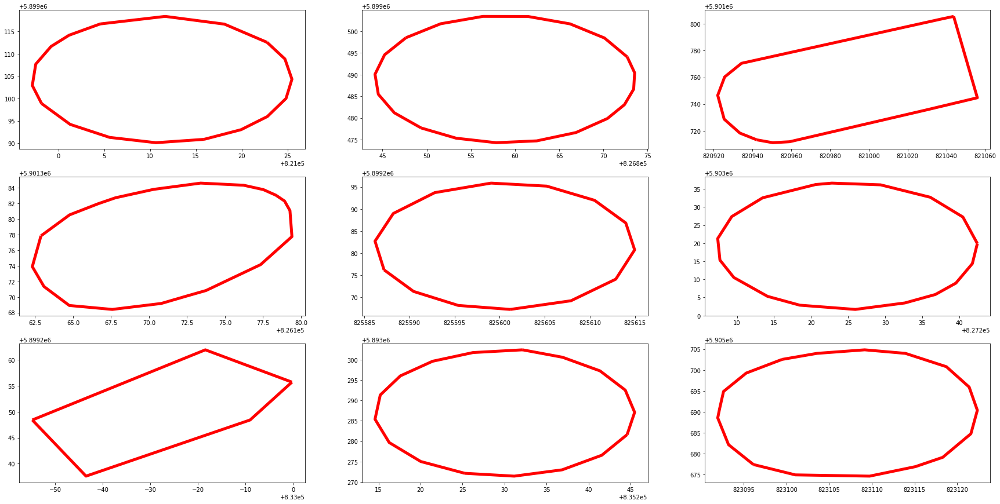

In [26]:
grouped = df.groupby('name')
streets = {}

fig=plt.figure()
fig, axes = plt.subplots(3,3)

for key, values in grouped:
    streets[key] = values
streets['Hallmattstrasse_0'].plot(ax=axes[0][0], color='red',linewidth=5.0) 
streets['Kreisel SteinhÃ¶lzli_-1'].plot(ax=axes[0][1], color='red',linewidth=5.0)
streets['Gilberte-de-Courgenay-Platz_-1'].plot(ax=axes[0][2], color='red',linewidth=5.0)
streets['Hubelmattstrasse_2'].plot(ax=axes[1][0], color='red',linewidth=5.0)
streets['Neuhausplatz_-1'].plot(ax=axes[1][1], color='red',linewidth=5.0)
streets['BÃ¼hlplatz_-1'].plot(ax=axes[1][2], color='red',linewidth=5.0)
streets['PourtalÃ¨sstrasse_1'].plot(ax=axes[2][0], color='red',linewidth=5.0)
streets['Rubigenstrasse_0'].plot(ax=axes[2][1], color='red',linewidth=5.0)
streets['Unterdettigenstrasse_1'].plot(ax=axes[2][2], color='red',linewidth=5.0)

## 3.6| Flight length over distance 
Another feature that can be interesting to look at is the ratio between flight distance and length computed on the curve.

In [27]:
sfdp=[] #street_flight_distance_percentage
for street in tqdm(dfp_features.iterrows()):
    d=street[1]['length']
    fd=street[1]['flight_distance']
    sfdp.append(fd/d)
dfp_features['percentage_flight_distance']=sfdp

A Jupyter Widget

Let's see if we have meaningful data (percentage of flight distance should be at most 1):

In [28]:
dfp_features_temp = dfp_features.sort_values('percentage_flight_distance',ascending=False)
dfp_features_temp[0:5]

,name,length,std_curvature,mean_curvature,max_curvature,min_curvature,skew_curvature,kurtosis_curvature,median_curvature,oneway,flight_distance,percentage_flight_distance
Progressive_index,,,,,,,,,,,,
2655,no_name_80,158.322908,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,158.322908,1.0
1738,Raintalweg_-1,45.083040,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,45.083040,1.0
305,Brunnmattstrasse_4,54.344766,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,54.344766,1.0
2522,Wydenhofstrasse_-1,115.013988,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,115.013988,1.0
2042,Sodweg_-1,177.119457,0.0,3.141593,3.141593,3.141593,0.0,-3.0,3.141593,0,177.119457,1.0


## 3.7| Derivative 
It is also possible to computed the derivative of the coordinate points of each street. As before, we firstly compute the derivative for each of the chunk of streets with the same name and then merging all the derivatives of the street in two lists (derivative_curr_x and derivative_curr_y). Again, as the derivate of each line has the same length of the line itself, to be able to compare derivates of different streets, we aggregate the coefficients by using the previous described 7 summary statistics (minimum, maximum, median and the first 4 moments).

In [29]:
std_derivative_x = []
mean_derivative_x = []
max_derivative_x = []
min_derivative_x = []
skew_derivative_x = []
kurtosis_derivative_x = []
median_derivative_x = []
std_derivative_y = []
mean_derivative_y = []
max_derivative_y = []
min_derivative_y = []
skew_derivative_y = []
kurtosis_derivative_y = []
median_derivative_y = []


for street_name in tqdm(dfp_features['name']):
    sub_gpdf=df[df.name==street_name]
    derivative_curr_x = []
    derivative_curr_y = []
    for index, row in sub_gpdf.iterrows():
        line_x= row['geometry'].xy[0]
        line_y= row['geometry'].xy[1]
        derivative_x = np.gradient(line_x)
        derivative_y = np.gradient(line_y)       
        derivative_curr_x.extend(derivative_x)
        derivative_curr_y.extend(derivative_y)

    std_derivative_x.append(np.std(derivative_curr_x))
    mean_derivative_x.append(np.mean(derivative_curr_x))
    max_derivative_x.append(np.max(derivative_curr_x))
    min_derivative_x.append(np.min(derivative_curr_x))
    skew_derivative_x.append(scipy.stats.skew(derivative_curr_x))
    kurtosis_derivative_x.append(scipy.stats.kurtosis(derivative_curr_x))
    median_derivative_x.append(np.median(derivative_curr_x))
    std_derivative_y.append(np.std(derivative_curr_y))
    mean_derivative_y.append(np.mean(derivative_curr_y))
    max_derivative_y.append(np.max(derivative_curr_y))
    min_derivative_y.append(np.min(derivative_curr_y))
    skew_derivative_y.append(scipy.stats.skew(derivative_curr_y))
    kurtosis_derivative_y.append(scipy.stats.kurtosis(derivative_curr_y))
    median_derivative_y.append(np.median(derivative_curr_y))
    
dfp_features['std_derivative_x'] = std_derivative_x
dfp_features['mean_derivative_x'] = mean_derivative_x
dfp_features['max_derivative_x'] = max_derivative_x
dfp_features['kurtosis_derivative_x'] = kurtosis_derivative_x
dfp_features['median_derivative_x'] = median_derivative_x
dfp_features['skew_derivative_x'] = skew_derivative_x
dfp_features['min_derivative_x'] = min_derivative_x
dfp_features['std_derivative_y'] = std_derivative_y
dfp_features['mean_derivative_y'] = mean_derivative_y
dfp_features['max_derivative_y'] = max_derivative_y
dfp_features['min_derivative_y'] = min_derivative_y
dfp_features['kurtosis_derivative_y'] = kurtosis_derivative_y
dfp_features['median_derivative_y'] = median_derivative_y
dfp_features['skew_derivative_y'] = skew_derivative_y

A Jupyter Widget

### 3.8| Export In CSV

In [30]:
dfp_features.to_csv('../data/features_bern.csv', encoding='utf-8')

# 4 | Graph Creation

### Read csv

In [31]:
dfp=pd.read_csv('../data/features_bern.csv',index_col='Progressive_index',encoding='utf-8')

In [32]:
dfp[0:5]

,name,length,std_curvature,mean_curvature,max_curvature,min_curvature,skew_curvature,kurtosis_curvature,median_curvature,oneway,...,median_derivative_x,skew_derivative_x,min_derivative_x,std_derivative_y,mean_derivative_y,max_derivative_y,min_derivative_y,kurtosis_derivative_y,median_derivative_y,skew_derivative_y
Progressive_index,,,,,,,,,,,,,,,,,,,,,
0,ARA-Strasse_-1,380.789011,0.109108,3.015231,3.141580,2.738821,-1.071367,0.418183,3.047087,0,...,11.509408,1.551789,4.436744,7.534558,10.528047,26.556762,1.908593,-0.560718,8.680791,0.762723
1,Aarbergergasse_-1,401.958124,0.025441,3.114920,3.141403,3.056522,-0.733484,-0.543281,3.127427,0,...,-14.443911,-0.774278,-52.494473,4.164734,6.184609,17.727013,1.137742,0.306972,4.421553,0.924600
2,AarbÃ¼hlstrasse_-1,169.771636,0.111169,3.008006,3.139367,2.871630,-0.113310,-1.749004,3.028933,0,...,-4.114835,-0.720305,-11.616711,8.599054,-19.360872,-9.058012,-38.942856,0.426518,-17.005812,-1.016285
3,Aarehalde_-1,198.987378,0.314167,2.893636,3.136984,2.450034,-0.697142,-1.500000,3.093891,1,...,27.530207,0.126653,-0.289251,18.178381,35.591284,64.651918,14.806284,-1.157604,38.679548,0.335735
4,Aarestrasse_-1,1600.259622,0.114674,3.062512,3.141515,2.534391,-2.928118,9.684166,3.097732,1,...,-12.153226,-0.751334,-43.210434,26.111982,31.960392,95.933273,2.699986,-0.129362,27.555015,0.970110


# 4.1| Weighting
Because not all the features have the same importance we need to assign them a weight, a multiplier that "gives more relevance" to one feature respect to one other. For example: 
curvature and percentage flight distance are more important than absolute distance. Even if they have heterogeneous ranges (curvature spans from 0 to pi for example) 
the normalization can make the weighting effective because it's applied using total mean and variance over the weighted vector

In [33]:
#tuning parameters
l=2          #coeff. for length
c=2          #coeff. for mean curvature
f=2          #coeff. for flight-distance
f_r=3.5      #coeff. for ratio flight-distance
o=1.5        #coeff. for one-way 
s=1.5        #coeff. for std_curvature
mi=0.25      #coeff. for min curvature
ma=3.5       #coeff. for max curvature
skew=1       #coeff. for skew curvature
kurt=0.5     #coeff. for kurtosis curvature
med=1.5      #coeff. for median curvature
dexstd = 1   #coeff. for std_derivative_x
dexmed = 1   #coeff. for median_derivative_x
dexskew=0.5  #coeff. for skew_derivative_x
dexkurt=0.25 #coeff. for kurtosis derivative x
dexmi = 1    #coeff. for min derivative x 
dexma = 1.5  #coeff. for max derivative x
dexmean = 1  #coeff. for mean derivative x
deymean = 1  #coeff. for mean derivative y
deymi = 1    #coeff. for min derivative y
deyma = 1.5  #coeff. for max derivative y
deystd = 1   #coeff. for std derivative y
deymed = 1   #coeff. for median derivative y
deyskew=0.5  #coeff. for skew derivative y
deykurt=0.25 #coeff. for kurtosis derivate y
bias=0.01    #generic bias


dfp['length']=dfp['length']*l
dfp['mean_curvature']=dfp['mean_curvature']*c
dfp['flight_distance']=dfp['flight_distance']*f
dfp['percentage_flight_distance']=dfp['percentage_flight_distance']*f_r
dfp['oneway']=dfp['oneway']*o
dfp['std_curvature']=dfp['std_curvature']*s
dfp['min_curvature']=dfp['min_curvature']*mi
dfp['max_curvature']=dfp['max_curvature']*ma
dfp['skew_curvature'] = dfp['skew_curvature']*skew
dfp['kurtosis_curvature'] = dfp['kurtosis_curvature']*kurt
dfp['median_curvature'] = dfp['median_curvature']*med
dfp['std_derivative_x'] = dfp['std_derivative_x']*dexstd
dfp['median_derivative_x'] = dfp['median_derivative_x']*dexmed
dfp['skew_derivative_x'] = dfp['skew_derivative_x']*dexskew
dfp['kurtosis_derivative_x'] = dfp['kurtosis_derivative_x']*dexkurt
dfp['min_derivative_x'] = dfp['min_derivative_x']*dexmi
dfp['max_derivative_x'] = dfp['max_derivative_x']*dexma
dfp['mean_derivative_x'] = dfp['mean_derivative_x']*dexmean
dfp['mean_derivative_y'] = dfp['mean_derivative_y']*deymean
dfp['min_derivative_y'] = dfp['min_derivative_y']*deymi
dfp['max_derivative_y'] = dfp['max_derivative_y']*deyma
dfp['std_derivative_y'] = dfp['std_derivative_y']*deystd
dfp['median_derivative_y'] = dfp['median_derivative_y']*deymed
dfp['skew_derivative_y'] = dfp['skew_derivative_y']*deyskew
dfp['kurtosis_derivative_y'] = dfp['kurtosis_derivative_y']*deykurt

# 4.2| Normalization

In [34]:
def normalize_min_max(df):
    return (df-df.min())/(df.max()-df.min())

def normalize_mean_std(df):
    return (df-df.mean())/df.std()


In [35]:
dfp_norm=dfp.copy()
dfp_norm.drop('name', axis=1, inplace=True)

dfp_norm=normalize_mean_std(dfp_norm);

We can also drop some of the features

In [36]:
#dfp_norm.drop('max_curvature', axis=1, inplace=True)
#dfp_norm.drop('min_curvature', axis=1, inplace=True)
#dfp_norm.drop('median_curvature', axis=1, inplace=True)
dfp_norm.drop('median_derivative_x', axis=1, inplace=True)
dfp_norm.drop('median_derivative_y', axis=1, inplace=True)
#dfp_norm.drop('skew_curvature', axis=1, inplace=True)
dfp_norm.drop('skew_derivative_x', axis=1, inplace=True)
dfp_norm.drop('skew_derivative_y', axis=1, inplace=True)
dfp_norm.drop('kurtosis_derivative_x', axis=1, inplace=True)
dfp_norm.drop('kurtosis_derivative_y', axis=1, inplace=True)
dfp_norm.drop('kurtosis_curvature', axis=1, inplace=True)

# 4.3| Symilarity matrix
Now, we'll create a similarity matrix between streets. 
Every street street is represented as a node and each edge has a weight that represents the similarity between two streets.

In [37]:
print('Matrix dimentions: {} x {}'.format(len(dfp_norm),len(dfp_norm)))


Matrix dimentions: 2677 x 2677


We firstly need to define the similarity measure

In [38]:
dist =spatial.distance.squareform(spatial.distance.pdist(dfp_norm.values,'braycurtis')) 
#dist =spatial.distance.squareform(spatial.distance.pdist(dfp_norm.values,'euclidean')) 
#dist =spatial.distance.squareform(spatial.distance.pdist(dfp_norm.values,'cityblock')) 
#dist =spatial.distance.squareform(spatial.distance.pdist(dfp_norm.values,'minkowski')) 
#dist =spatial.distance.squareform(spatial.distance.pdist(dfp_norm.values,'cosine')) 

Check if it is symmetric and how many zeros do we have

In [39]:
print('Number of zero elements: {}'.format(np.sum(dist==0)))

Number of zero elements: 2695


...and check if we have a symmetric matrix

In [40]:
is_sym = np.sum(np.around((dist-np.transpose(dist)),14)!=0)
# a correct implementation should pass the below test.
assert is_sym == 0

We can also plot an histogram of the distances.

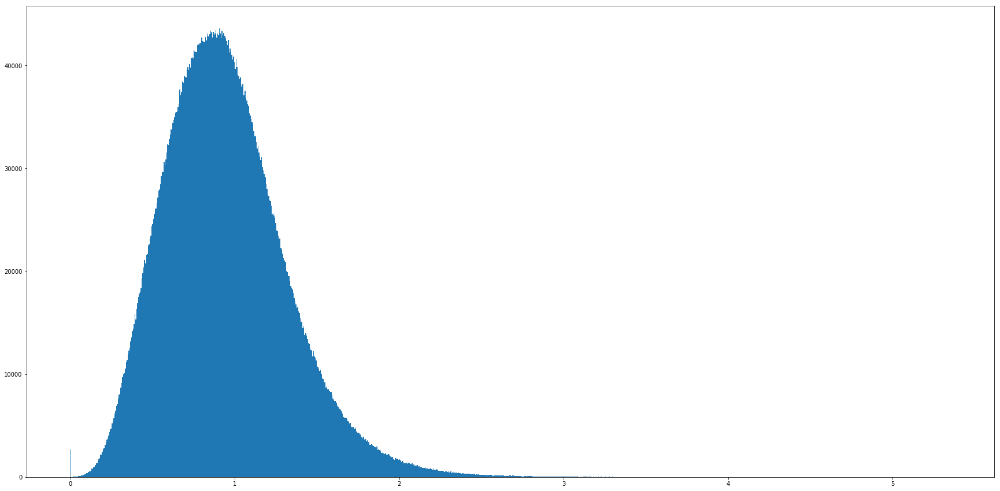

In [41]:
plt.hist(dist.reshape(-1), bins=1000);

# 4.4| Kernel
A kernel is used to compute the weight of each edge (strong edges for the streets whose distance is short). One of the most used, that works well in this case too is the Gaussian kernel.

In [42]:
W=np.exp(-(dist**2)/(dist.mean()**2))
np.fill_diagonal(W, 0) #fill the diagonal with zeros to avoid self-connections

We can also visualise the results (histogram)

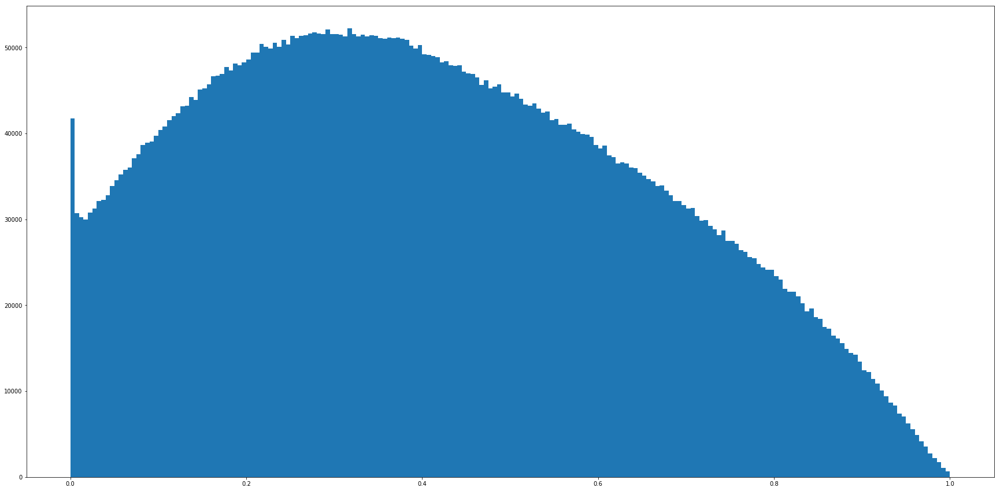

In [43]:
plt.hist(W.reshape(-1), bins=200);

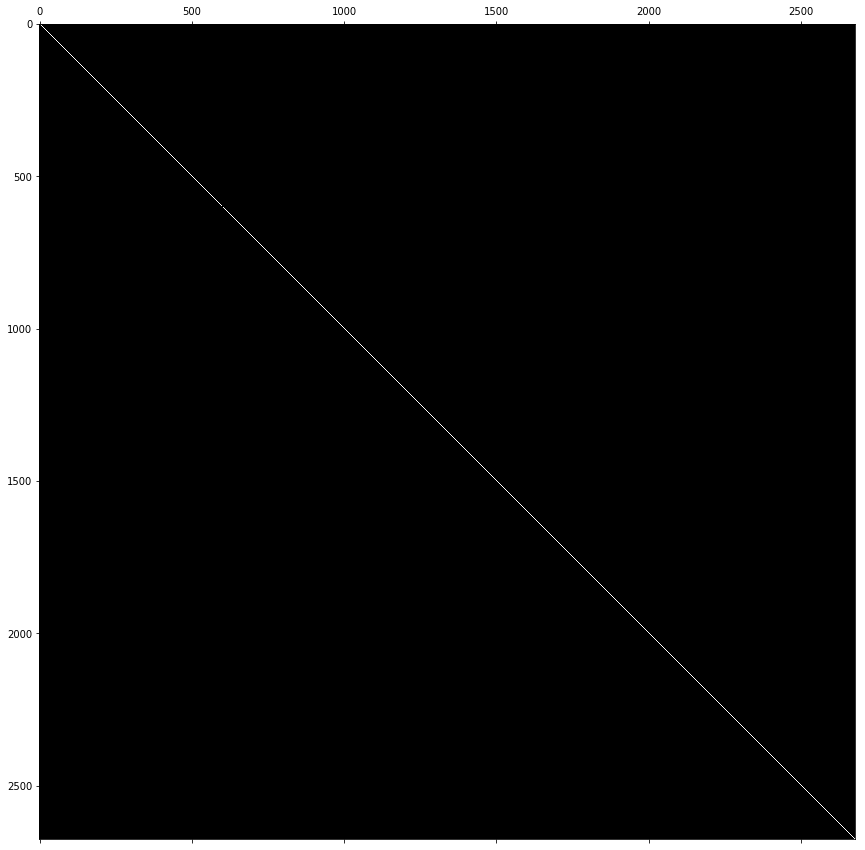

In [44]:
plt.spy(W)

# 4.5| KNN
To sparsify the matrix, we eliminate the N-K weakest edges for each node (where N is dimention of the matrix).

In [45]:
NEIGHBOURS = 130 
indeces = np.argsort(W, axis=1)
indeces = indeces[:,:len(W)-NEIGHBOURS]
indeces = np.arange(W.shape[0])[:,None], indeces
W[indeces] = 0

Let's symmetrize it:

In [46]:
W_sparse=np.maximum(W,np.transpose(W))

And visualise it:

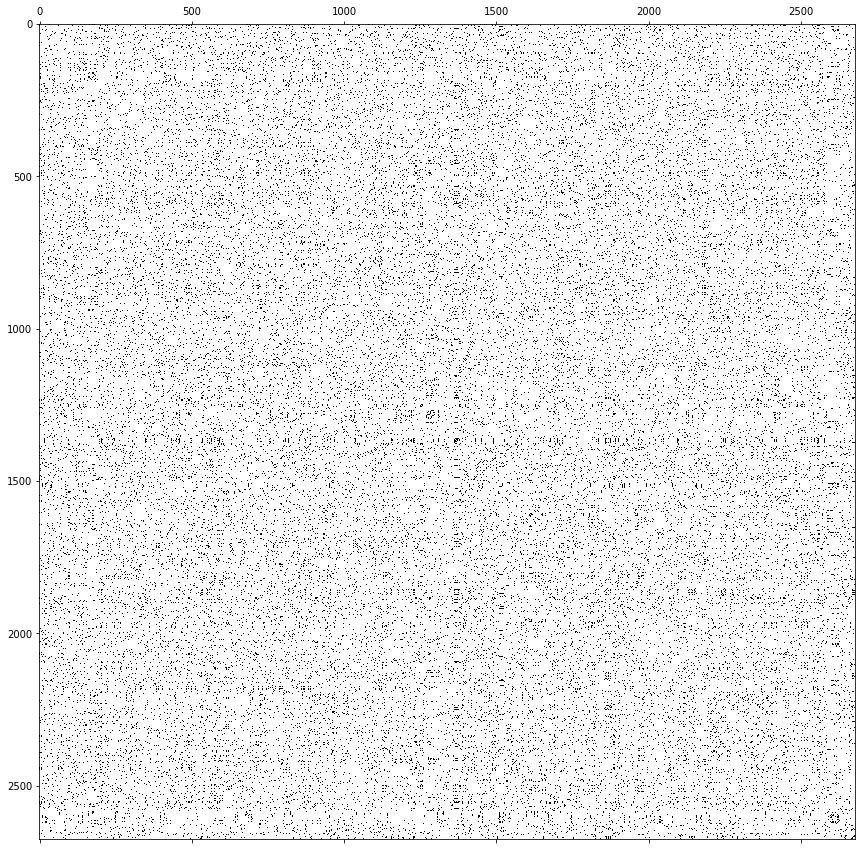

In [47]:
plt.spy(W_sparse)

Weight distribution:

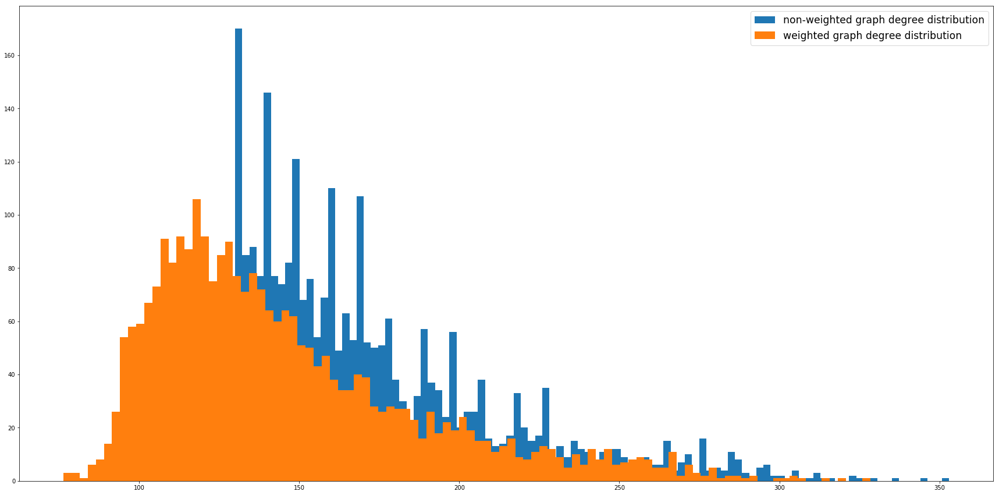

In [48]:
degrees = W_sparse.sum(0)

plt.hist(np.count_nonzero(W_sparse, 0), bins=100, label='non-weighted graph degree distribution')
plt.hist(degrees, bins=100, label='weighted graph degree distribution')
plt.legend(fontsize = 'xx-large')

# 4.6| Graph

In [49]:
G = graphs.Graph(W_sparse)
print('{} nodes, {} edges'.format(G.N, G.Ne))

2677 nodes, 233218 edges


In [50]:
G.is_connected()

True

# 4.7| Laplacian 
Since the clusterization will need the Fiedler vector, we compute the normalized Laplacian

In [51]:
G.compute_laplacian('normalized')
laplacian = G.L

We compute the very first eigenvalues (to avoid a full eigendecomposition on big matrices)

In [52]:
eigenvalues, eigenvectors = sparse.linalg.eigsh(laplacian,k=6,which='SM')
print(eigenvalues)

[ -6.82133705e-17   1.33395326e-01   1.95137560e-01   2.10906166e-01
   2.22253578e-01   3.53695448e-01]


Note that the first eigenvalue is almost zero (meaning that the graph is connected)

In [53]:
print(eigenvalues[0])

-6.82133704612e-17


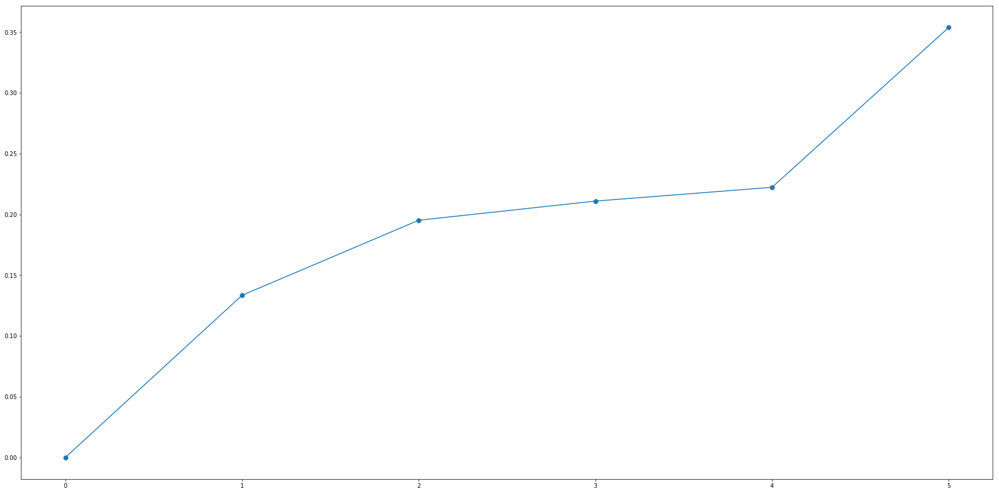

In [54]:
plt.plot(eigenvalues, '.-', markersize=15);

# 4.8| Visulazing the Fiedler vector

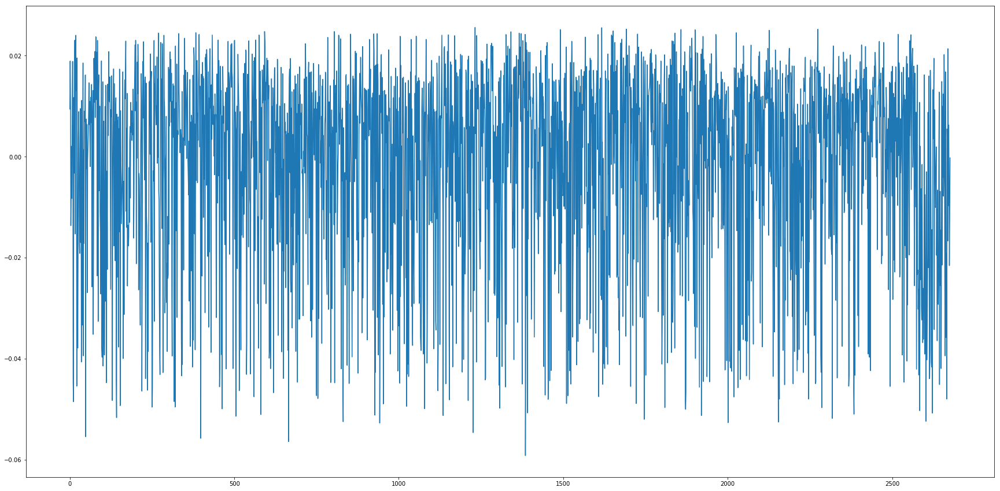

In [55]:
plt.plot(eigenvectors[:, 1])

## 4.9| Graph embedding
We can use the value of the second eigenvector of the Laplacian matrix as the x coordinate of a node and the value of the third eigenvector as the y coordinate. The color is indicated by the sign of the Fiedler vector.

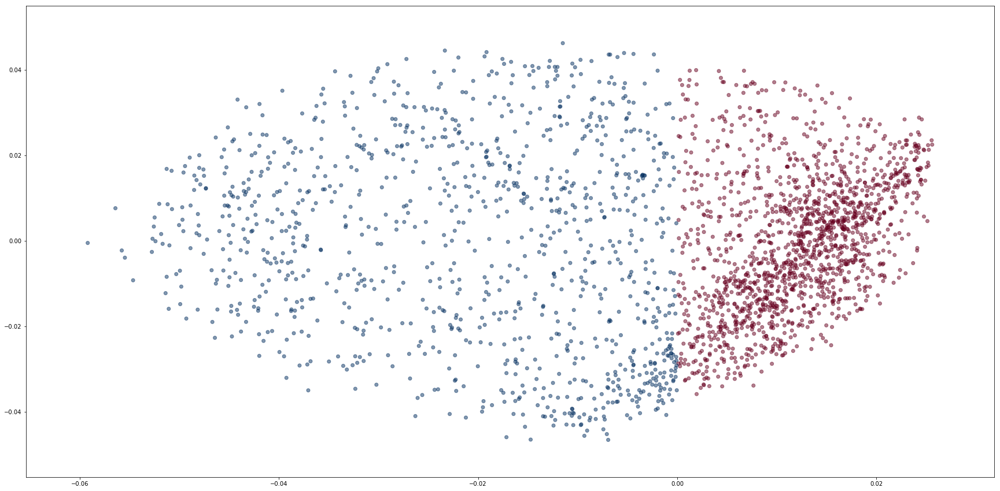

In [56]:
labels = (eigenvectors[:,1]<0).astype(int)
x = eigenvectors[:,1]
y = eigenvectors[:,2]

plt.scatter(x, y, c=labels, cmap='RdBu', alpha=0.5);

Now, we'll store the values of the sign of the Fiedler vector together with the name of the corresponding street on a dataframe to be able to visualise the results of the clusterization on a map

In [57]:
signal=labels*2-1

In [58]:
labled={}
for index,row in dfp.iterrows():
    labled[str(row['name'])]=signal[index]

name={'name':list(labled.keys())}
pd_label=pd.DataFrame(name)
pd_label['lable']=labled.values()
pd_label.index.name='Progressive_index'
pd_label.to_csv('../data/labled_bern.csv', encoding='utf-8')
pd_label[0:5]

,name,lable
Progressive_index,,
0,ARA-Strasse_-1,-1
1,Aarbergergasse_-1,-1
2,AarbÃ¼hlstrasse_-1,-1
3,Aarehalde_-1,1
4,Aarestrasse_-1,1


Let's visualize the Fiedler vector over the graph

In [59]:
G.set_coordinates()

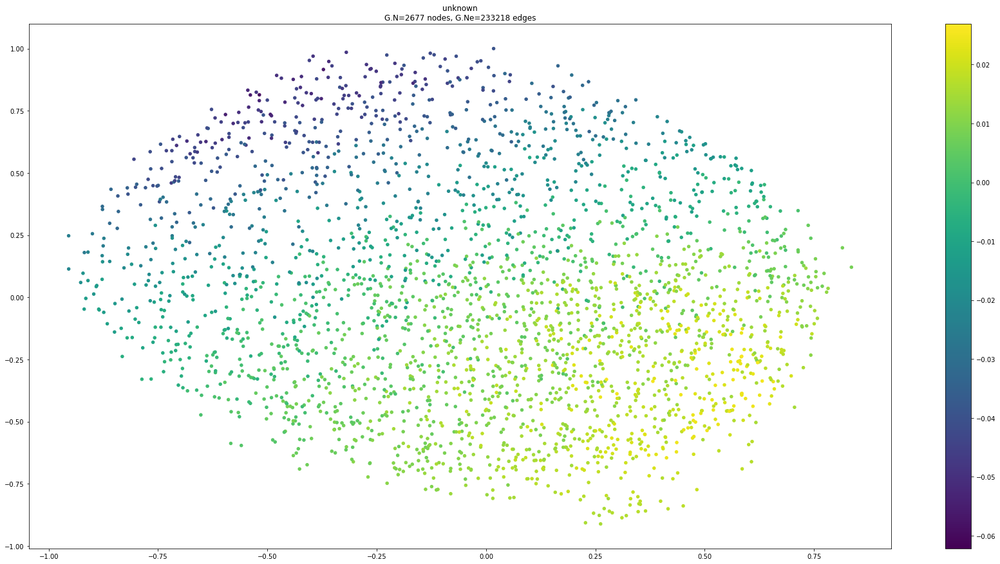

In [60]:
G.plot_signal(eigenvectors[:,1], vertex_size=20)

...and its sign

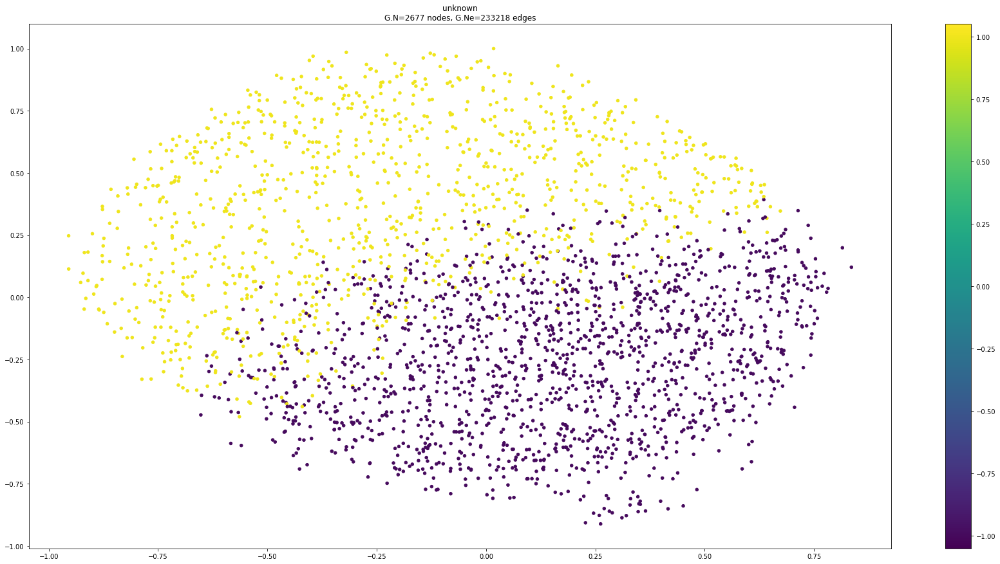

In [61]:
G.plot_signal(signal, vertex_size=20)

# 5 | Results

In [62]:
# Loading the downloaded shapefile
# Bern
shapefile_dir = '../data/bern_switzerland.imposm-shapefiles'
shapefile_name ='bern_switzerland_osm_roads.shp'

#Budapest
#shapefile_dir = '../data/budapest'
#shapefile_name ='budapest_hungary_osm_roads.shp'

#Avia
#shapefile_dir = '../data/avia'
#shapefile_name ='ex_S9FVmMQ5ZQ7RRCSD68Hm5SNFNvwcB_osm_roads.shp'

shapefile_roads = os.path.join(shapefile_dir, shapefile_name)

# Here we create the GeoPandas Dataset:
dfp_original = gpd.GeoDataFrame.from_file(shapefile_roads)
# Renaming all streets tag with "None"  to "no_name
dfp_original.name[dfp_original.name.isnull() == True] = 'no_name'
dfp_original = dfp_original.to_crs({'init': 'epsg:3395'})

In [63]:
dfp=pd.read_csv('../data/labled_bern.csv',index_col='Progressive_index',encoding='utf-8')
df_gp = gpd.GeoDataFrame.from_file('../data/cleaned_dataset_bern.shp')
df_gp_blue=df_gp.copy()
df_gp_blue=df_gp_blue.set_index('name')
df_gp_red=df_gp.copy()
df_gp_red=df_gp_red.set_index('name')

In [64]:
for row in tqdm(dfp.iterrows()):
    name=row[1]['name']
    if row[1]['lable']==1:
        df_gp_blue.drop(name,inplace=True)
    else:
        df_gp_red.drop(name,inplace=True)

A Jupyter Widget

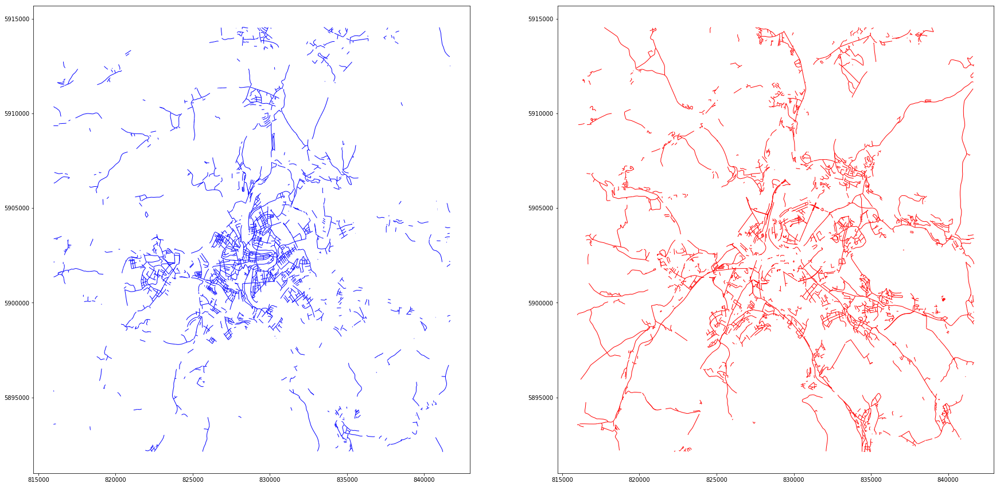

In [65]:
fig=plt.figure()
fig, axes = plt.subplots(1, 2)

ax_blue=df_gp_blue.plot(ax=axes[0],color='blue',linewidth=1.0)
ax_red=df_gp_red.plot(ax=axes[1],color='red',linewidth=1.0)

Finnaly, here is the resulting seperation of Bern:

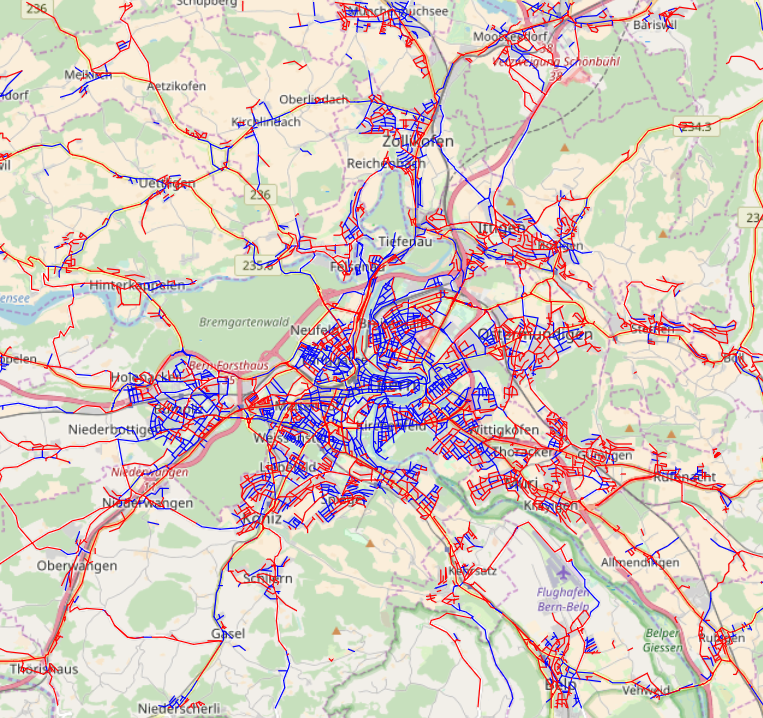

## 6 | Algorithm performance
To test the efficacy of the algorithm we can let it run on a dataframe obtained by merging two cities: a very new one (New York) and a rural locality (Lama Mocogno, a municipality in the Province of Modena, Italy). The data is ordered: first 4283 raws refer to New York and all the others to Lama Mocogno.

In [67]:
df=pd.read_csv('../data/features_two_cities.csv',index_col='index',encoding='utf-8')
dfp=pd.read_csv('../data/features_twocities_lamamocogne_newyork_new.csv',encoding='utf-8')

Let's quickly redo the previous steps for this dataset

In [68]:
#we create the distances
dist =spatial.distance.squareform(spatial.distance.pdist(df.values,'braycurtis')) 
#build the weight matrix
W=np.exp(-(dist**2)/(dist.mean()**2))
np.fill_diagonal(W, 0)
#sparsify the matrix with KNN
NEIGHBOURS = 1205 
indeces = np.argsort(W, axis=1)
indeces = indeces[:,:len(W)-NEIGHBOURS]
indeces = np.arange(W.shape[0])[:,None], indeces
W[indeces] = 0
#symmetrize it
W_sparse=np.maximum(W,np.transpose(W))

Let's visualize W

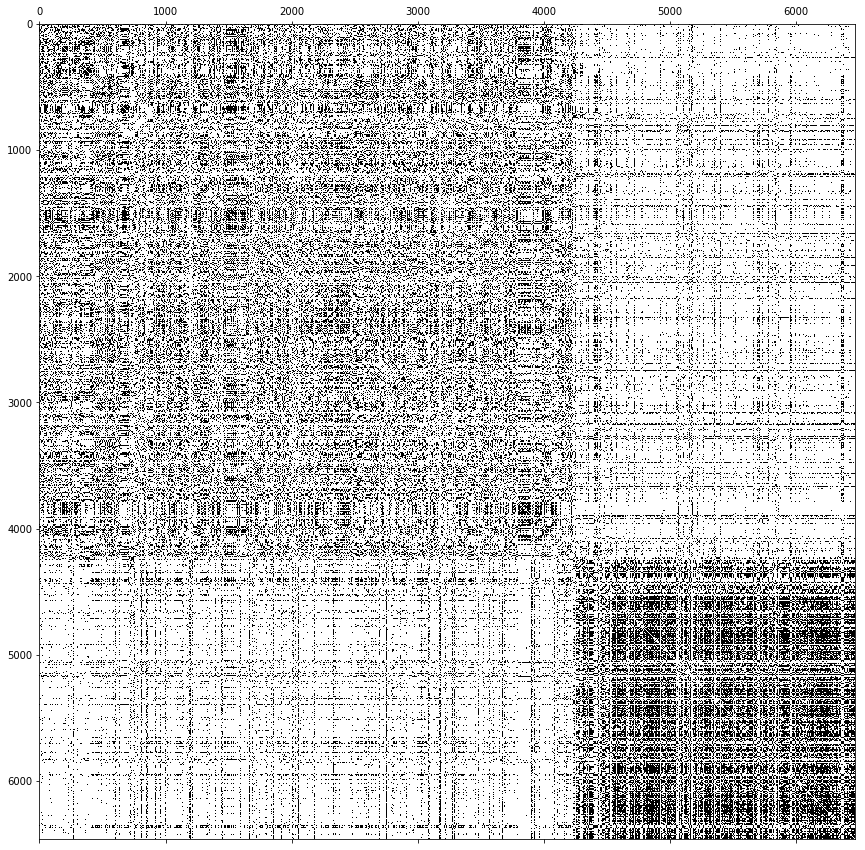

In [69]:
plt.spy(W_sparse)

Note that there are shorter distances between streets from the same city.

Compute the graph Laplacian

In [70]:
G = graphs.Graph(W_sparse)
G.compute_laplacian('normalized')
laplacian = G.L

Compute eigenvectors and eigenvalues

In [71]:
eigenvalues, eigenvectors = sparse.linalg.eigsh(laplacian,k=6,which='SM')
print(eigenvalues)
print(eigenvalues[1])

[  6.91030522e-17   1.01336189e-01   3.77339490e-01   4.46523210e-01
   5.04400081e-01   5.73444806e-01]
0.101336188806


As before, we use the value of the second eigenvector of the Laplacian matrix as the x coordinate of a node and the value of the third eigenvector as the y coordinate. The color is indicated by the sign of the Fiedler vector.

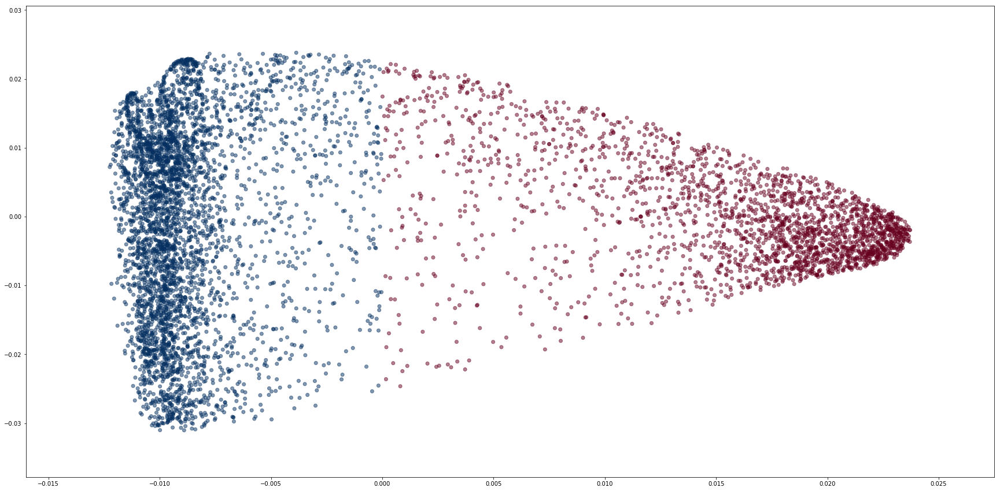

In [72]:
labels = (eigenvectors[:,1]<0).astype(int)
x = eigenvectors[:,1]
y = eigenvectors[:,2]

plt.scatter(x, y, c=labels, cmap='RdBu', alpha=0.5);

Let's retrieve the ground truth city categorization. We've built a dataframe containing all the names of the streets of the two cities and the corresponding lable (1 for New York and -1 for Lama)

In [73]:
pd_label = pd.read_csv('../data/labled_features_twocities_lamamocogne_newyork_new.csv', encoding='utf-8')

In [74]:
pd_label.head(2)

,Progressive_index,name,lable
0,0,0,1.0
1,1,1,1.0


In [75]:
pd_label.tail(2)

,Progressive_index,name,lable
6462,6462,6462,-1.0
6463,6463,6463,-1.0


In [76]:
cities = preprocessing.LabelEncoder().fit_transform(pd_label['lable'])

Now, let's plot it, but with the color indicated by the ground truth labelling

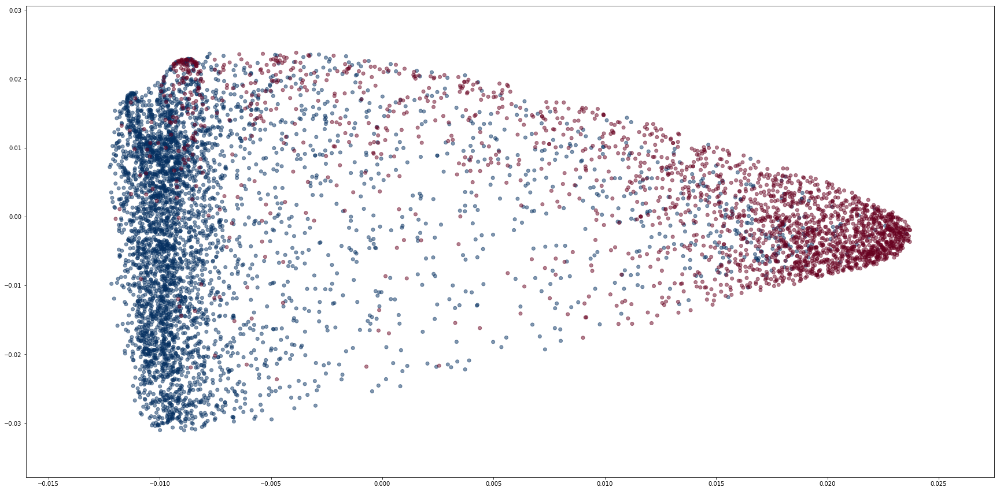

In [77]:
labels = (eigenvectors[:,1]<0).astype(int)
x = eigenvectors[:,1]
y = eigenvectors[:,2]

plt.scatter(x, y, c=cities, cmap='RdBu', alpha=0.5);

Let's compute how many streets were wrongly classified by the Fiedler vector according to the ground truth

In [78]:
err = np.count_nonzero(cities - labels)
err = err if err < len(labels) / 2 else len(labels) - err
print('{} errors ({:.2%})'.format(err, err/len(labels)))

837 errors (12.95%)


Finally, we can plot the two cities on the map as before

In [79]:
signal=labels*2-1

In [80]:
labled={}
for index,row in dfp.iterrows():
    labled[str(row['name'])]=signal[index]

name={'name':list(labled.keys())}
pd_label=pd.DataFrame(name)
pd_label['lable']=labled.values()
pd_label.index.name='Progressive_index'
pd_lable_new=pd_label[0:4282].copy();
pd_label_lama=pd_label[4283:len(pd_label)].copy();
pd_label.to_csv('../data/labled_new_lama_big.csv', encoding='utf-8')
pd_lable_new.to_csv('../data/labled_new_in_set_lama_big.csv', encoding='utf-8')
pd_label_lama.to_csv('../data/labled_lama_big_in_set_new.csv', encoding='utf-8')
pd_label[0:10]

,name,lable
Progressive_index,,
0,10th Avenue_0,1
1,10th Avenue_1,1
2,10th Street_0,1
3,10th Street_-1,1
4,10th Street_1,1
5,10th Street_2,1
6,11th Avenue_0,1
7,11th Avenue_-1,1
8,11th Avenue_4,1


Plot

In [81]:
shapefile_dir = '../data/Lama_Mocogne_area'
shapefile_name ='ex_UWxd3ovMDcQwonMEUFyC4SE9R84bu_osm_roads.shp'
shapefile_roads = os.path.join(shapefile_dir, shapefile_name)

# Here we create the GeoPandas Dataset:
dfp_original = gpd.GeoDataFrame.from_file(shapefile_roads)
# Renaming all streets tag with "None"  to "no_name
dfp_original.name[dfp_original.name.isnull() == True] = 'no_name'
dfp_original = dfp_original.to_crs({'init': 'epsg:3395'})

dfp=pd.read_csv('../data/labled_lama_big_in_set_new.csv',index_col='Progressive_index',encoding='utf-8')
df_gp = gpd.GeoDataFrame.from_file('../data/cleaned_dataset_lamamocogne_new.shp')
df_gp_blue=df_gp.copy()
df_gp_blue=df_gp_blue.set_index('name')
df_gp_red=df_gp.copy()
df_gp_red=df_gp_red.set_index('name')

for row in tqdm(dfp.iterrows()):
    name=row[1]['name']
    if row[1]['lable']==1:
        df_gp_blue.drop(name,inplace=True)
    else:
        df_gp_red.drop(name,inplace=True)

A Jupyter Widget

### Result of Lama Mocogno

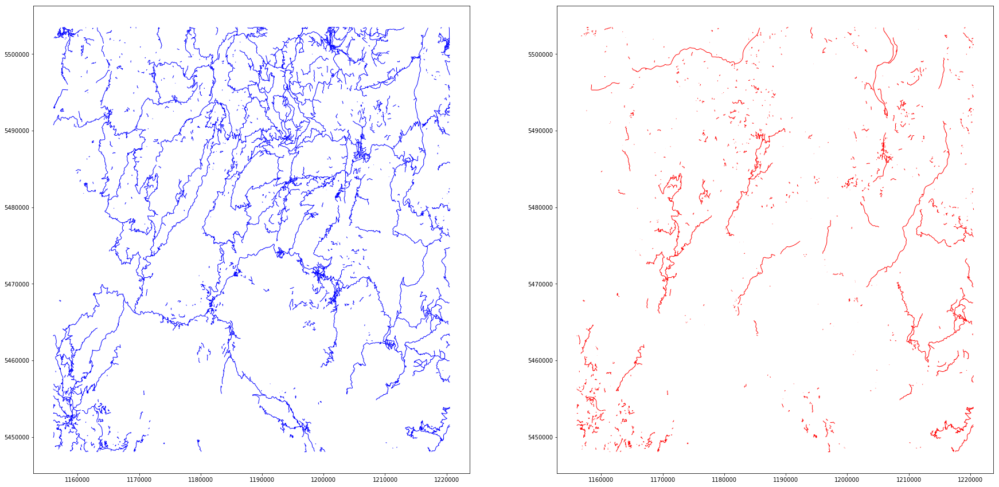

In [82]:
fig=plt.figure()
fig, axes = plt.subplots(1, 2)

ax_blue=df_gp_blue.plot(ax=axes[0],color='blue',linewidth=1.0)
ax_red=df_gp_red.plot(ax=axes[1],color='red',linewidth=1.0)

In [83]:
mplleaflet.show(fig=ax_blue.figure, crs=dfp_original.crs);

In [84]:
#NY
shapefile_dir = '../data/newyork'
shapefile_name ='ex_LrzRkmVP8Si2zoixHivCQeGvUaTaJ_osm_roads.shp'

shapefile_roads = os.path.join(shapefile_dir, shapefile_name)

# Here we create the GeoPandas Dataset:
dfp_original = gpd.GeoDataFrame.from_file(shapefile_roads)
# Renaming all streets tag with "None"  to "no_name
dfp_original.name[dfp_original.name.isnull() == True] = 'no_name'
dfp_original = dfp_original.to_crs({'init': 'epsg:3395'})

dfp=pd.read_csv('../data/labled_new_in_set_lama_big.csv',index_col='Progressive_index',encoding='utf-8')
df_gp = gpd.GeoDataFrame.from_file('../data/cleaned_dataset_newyork.shp')
df_gp_blue=df_gp.copy()
df_gp_blue=df_gp_blue.set_index('name')
df_gp_red=df_gp.copy()
df_gp_red=df_gp_red.set_index('name')

for row in tqdm(dfp.iterrows()):
    name=row[1]['name']
    if row[1]['lable']==1:
        df_gp_blue.drop(name,inplace=True)
    else:
        df_gp_red.drop(name,inplace=True)

A Jupyter Widget

### Result of New York

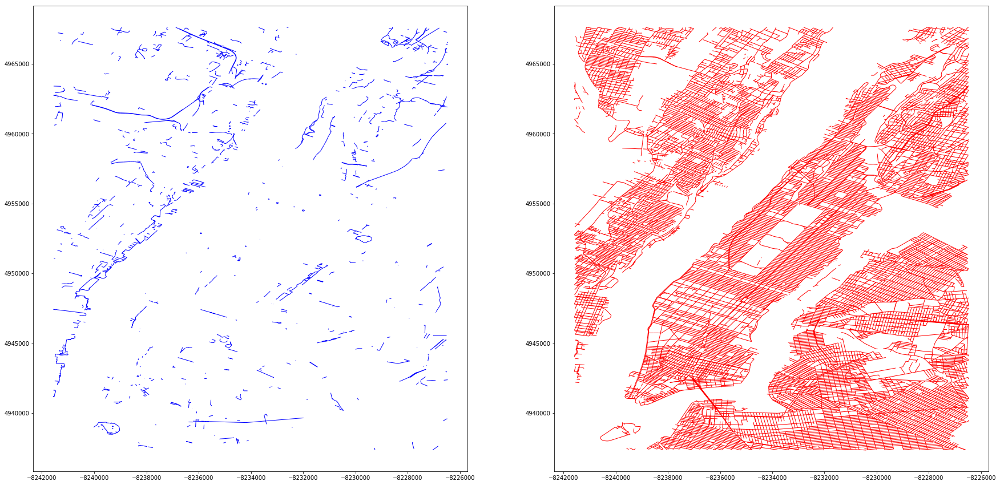

In [85]:
fig=plt.figure()
fig, axes = plt.subplots(1, 2)

ax_blue=df_gp_blue.plot(ax=axes[0],color='blue',linewidth=1.0)
ax_red=df_gp_red.plot(ax=axes[1],color='red',linewidth=1.0)

In [86]:
mplleaflet.show(fig=ax_blue.figure, crs=dfp_original.crs);

## 7 | Buda + Pest  = Budapest

Budapest is the capital of the Hungury. There were two different cities and they merged to become Budapest in 19th Century. Because of curiosity, we have tried our algorithm on the roads of Budapest. 

The results shows that on the left side of the river, roads are mostly in blue and on the right side there are more roads with red. This indicates that in fact they were two different cities. 

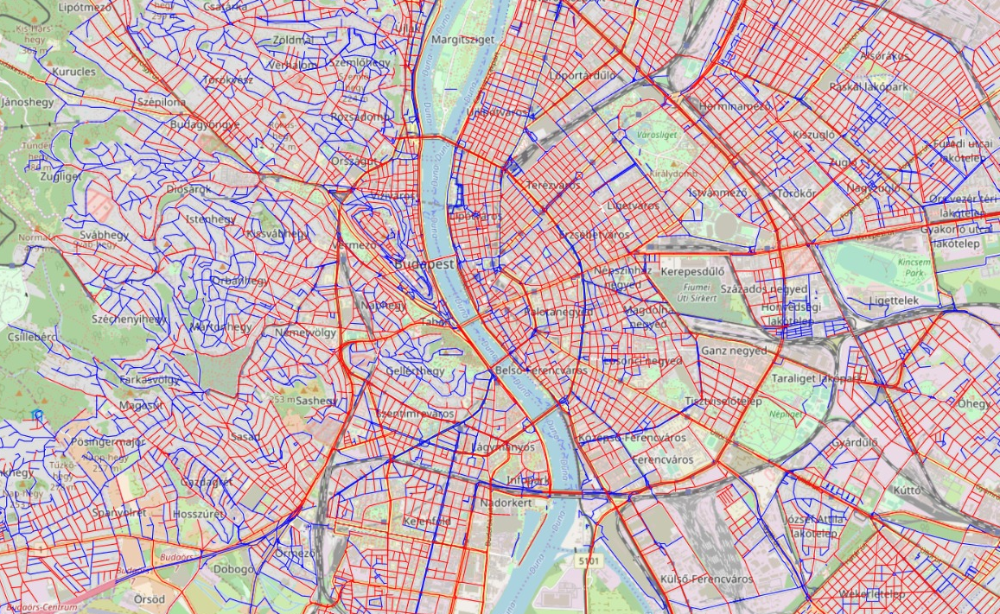